# Проект по анализу данных с сайта Лента(https://lenta.ru/). Часть 1.

Подключаем библиотеки.

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import datetime
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords

nltk.download("stopwords")
sns.set(style="darkgrid")
%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kukof\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Откроем файлы, полученные при парсинге с сайтов lenta, rbc, mail и газета.

In [30]:
df_lenta = pd.read_pickle('parcing/df_lenta.p', compression='gzip')
df_gazeta = pd.read_pickle('parcing/df_gazeta.p', compression='gzip')
df_mail = pd.read_pickle('parcing/df_mail.p', compression='gzip')
df_rbc = pd.read_pickle('parcing/df_rbc.p', compression='gzip')
df = pd.concat([df_lenta, df_gazeta, df_mail, df_rbc])
df.head()

,url,source,title,content,datetime,topic,year,month,weekday,len_title,len_content,lifetime,id
0,https://lenta.ru//news/2023/10/22/v-velikobrit...,lenta,В Великобритании слили в сеть личный номер тел...,Личный номер телефона премьер-министра Великоб...,2023-10-22 00:00:00,crime,2023.0,October,Sunday,68.0,674.0,7635.0,NaN
1,https://lenta.ru//news/2023/10/22/kitay-vyyavi...,lenta,Китай выявил шпионившего в пользу США на оборо...,Спецслужбы Китая выявили случай шпионажа в пол...,2023-10-22 00:00:00,crime,2023.0,October,Sunday,62.0,1063.0,7635.0,NaN
2,https://lenta.ru//news/2023/10/17/v-belgii-lik...,lenta,В Бельгии ликвидировали подозреваемого в напад...,"Полиция в Бельгии нейтрализовала человека, кот...",2023-10-17 00:00:00,crime,2023.0,October,Tuesday,61.0,842.0,14835.0,NaN
3,https://lenta.ru//news/2023/10/16/missiyu-oon-...,lenta,Миссию ООН обокрали в секторе Газа,Ближневосточное агентство ООН для помощи палес...,2023-10-16 00:00:00,crime,2023.0,October,Monday,34.0,1136.0,16275.0,NaN
4,https://lenta.ru//news/2023/10/13/vo-frantsii-...,lenta,Во Франции задержали еще одного человека с нож...,Французская полиция задержала еще одного воору...,2023-10-13 00:00:00,crime,2023.0,October,Friday,64.0,852.0,20595.0,NaN


Удалим id новостей.

In [31]:
df.drop(columns='id', inplace=True)
df = df.reset_index(drop=True)
df.head()

,url,source,title,content,datetime,topic,year,month,weekday,len_title,len_content,lifetime
0,https://lenta.ru//news/2023/10/22/v-velikobrit...,lenta,В Великобритании слили в сеть личный номер тел...,Личный номер телефона премьер-министра Великоб...,2023-10-22 00:00:00,crime,2023.0,October,Sunday,68.0,674.0,7635.0
1,https://lenta.ru//news/2023/10/22/kitay-vyyavi...,lenta,Китай выявил шпионившего в пользу США на оборо...,Спецслужбы Китая выявили случай шпионажа в пол...,2023-10-22 00:00:00,crime,2023.0,October,Sunday,62.0,1063.0,7635.0
2,https://lenta.ru//news/2023/10/17/v-belgii-lik...,lenta,В Бельгии ликвидировали подозреваемого в напад...,"Полиция в Бельгии нейтрализовала человека, кот...",2023-10-17 00:00:00,crime,2023.0,October,Tuesday,61.0,842.0,14835.0
3,https://lenta.ru//news/2023/10/16/missiyu-oon-...,lenta,Миссию ООН обокрали в секторе Газа,Ближневосточное агентство ООН для помощи палес...,2023-10-16 00:00:00,crime,2023.0,October,Monday,34.0,1136.0,16275.0
4,https://lenta.ru//news/2023/10/13/vo-frantsii-...,lenta,Во Франции задержали еще одного человека с нож...,Французская полиция задержала еще одного воору...,2023-10-13 00:00:00,crime,2023.0,October,Friday,64.0,852.0,20595.0


Посмотрим на размер итогового dataframe.

In [32]:
df.shape

(43095, 12)

Посчитаем кол-во дублей новостей и удалим их.

In [33]:
print(len(df[df.duplicated()]))
df = df.drop_duplicates()

4103


In [34]:
df.shape

(38992, 12)

Проверим, есть ли пропуски в данных.

In [35]:
df.isnull().sum()

url                0
source             0
title              0
content            0
datetime           0
topic              0
year           21222
month          21222
weekday        21222
len_title      34593
len_content    34593
lifetime       34593
dtype: int64

Посмотрим на размер итогового dataframe после удаления дублей.

Посмотрим на типы топиков, так как мы парсили их из разделов, нужно объединить разделы в основной.

In [36]:
df.topic.value_counts()

topic
politics     6204
culture      4343
sport        4190
science      3787
media        3655
incident     3472
society      2948
crime        2711
life         2296
accident     1674
russia       1087
economics    1068
army          900
social        346
travel        311
Name: count, dtype: int64

Объединим social с society, а incident с crime.

In [41]:
dict = {'incident': 'crime', 'social': 'society'}
df.topic = df.topic.replace(dict)
df.topic.value_counts()

topic
politics     6204
crime        6183
culture      4343
sport        4190
science      3787
media        3655
society      3294
life         2296
accident     1674
russia       1087
economics    1068
army          900
travel        311
Name: count, dtype: int64

Категории не сбалансированы, возможно, позднее нужно будет объединить, например, crime+accident. Economics, travel значительно меньше остальных категорий. В этих разделах меньше всего статей. Высока вероятность, что на них модель будет часто ошибаться.

Text(0.5, 1.0, 'Number of news by topics')

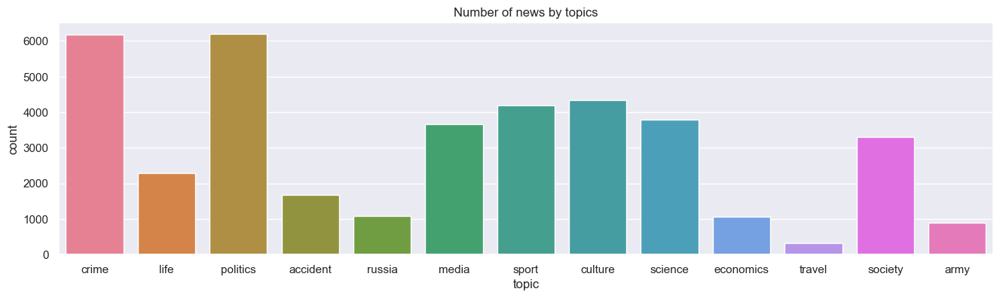

In [42]:
sns.set_palette('tab10')
fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(16,4))
sns.countplot(df, x = "topic", hue = "topic")
plt.title('Number of news by topics')

Сама по себе дата как строка не является признаком, однако ее компоненты могут играть важную роль в работе модели. Поэтому мы преобразуем строковую дату в формат datetime и добавим к нашим признакам год, месяц и день недели.

In [43]:
df[df.topic=='culture'].source.value_counts()

source
lenta     3492
gazeta     851
Name: count, dtype: int64

In [44]:
df['datetime'] = pd.to_datetime(df.datetime)
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.strftime("%B")
df['weekday'] = df['datetime'].dt.strftime('%A')

Какие выводы можно сделать по графикам ниже:
- Практически все новости относятся к 23 году
- Больше всего новостей приходится на осень (сентябрь, октябрь)
- Меньше всего новостей в выходные и больше всего в середине недели

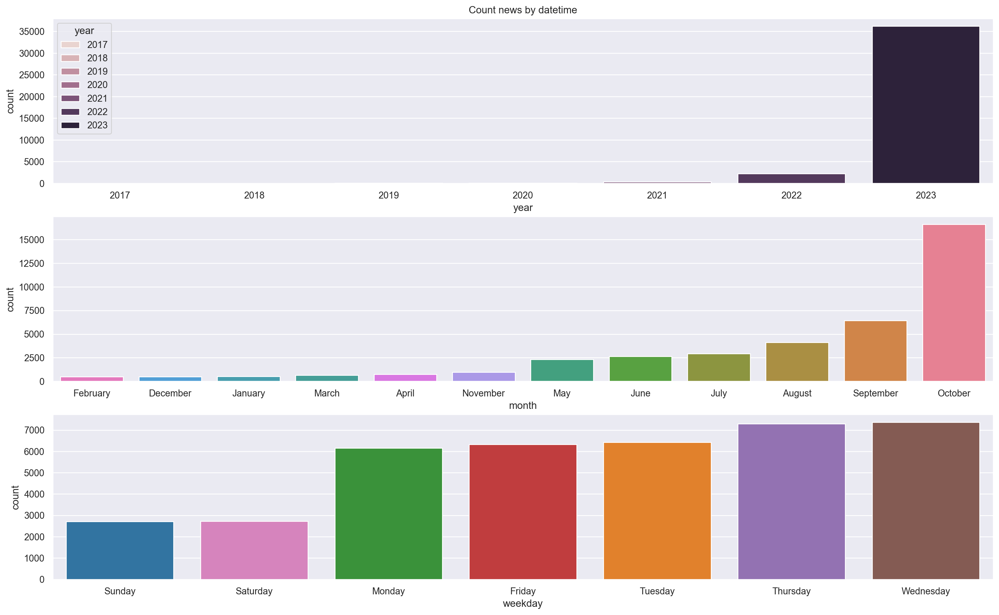

In [45]:
fig, axs = plt.subplots(3, 1, figsize=(20, 12), dpi=200)
for ind, col in enumerate(['year', 'month', 'weekday']):
    sns.set_palette('tab10')
    sns.countplot(df, x=col, hue = col, ax=axs[ind], order=df[col].value_counts(ascending=True).index)
axs[0].set_title('Count news by datetime');

Посчитаем длину заголовка и основного текста.

In [46]:
df['len_title'] = df['title'].str.len()
df['len_content'] = df['content'].str.len()

Посмотрим, как они выглядят в разрезе каждой категории.

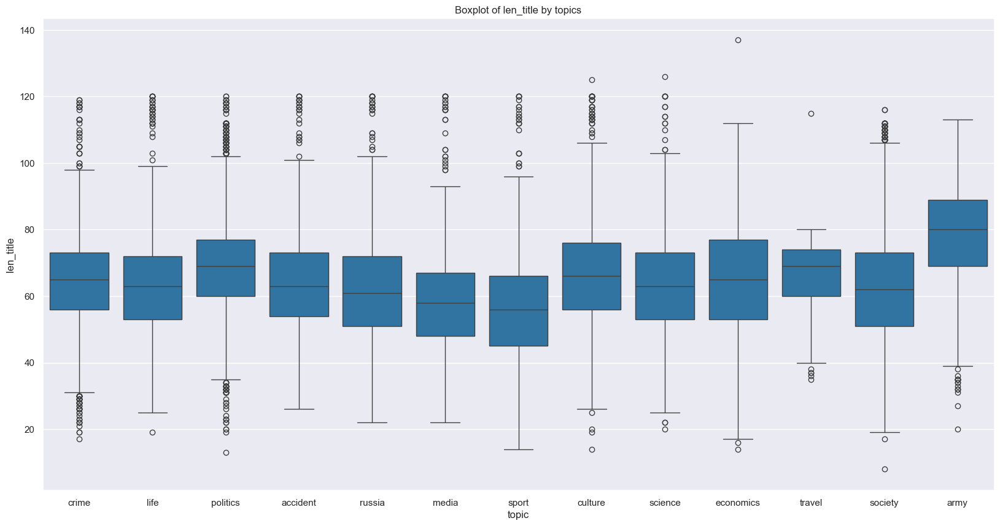

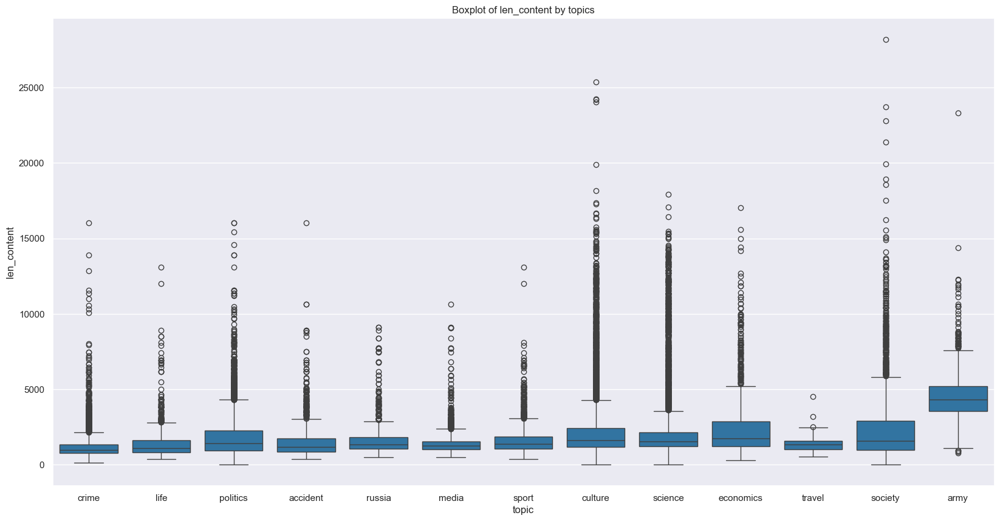

In [47]:
for col in ['len_title', 'len_content']:
    fig, ax = plt.subplots(1, 1, figsize=(20, 10), dpi=100)
    sns.boxplot(x="topic", y=col, data=df, ax=ax)
    plt.title(f'Boxplot of {col} by topics');

Что можно заметить:
- В среднем длина заголовка по всем категориям около 65 символов
- Длина текста имеет тяжелые хвосты, особенно по категориям: culture, society, army.

Посмотрим на числянное значение медианы по столбцам с длиной заголовка и длиной текста.

In [49]:
print(df['len_title'].median())
print(df['len_content'].median())

64.0
1347.0


Посмотрим, какие ключевые слова чаще всего встречаются в статьях каждой тематики. Одной из гипотез является то, что статьи разных, но при этом близких тематик с одинаковыми ключевыми словами могут вносить негативный вклад в работу модели.

In [50]:
stop_words = stopwords.words('russian')
stop_words.extend(['что', 'это', 'так', 'вот', 'быть', 'как', 'в', '—', 'к', 'за', 'из',
                   'из-за','на', 'ок', 'кстати', 'который', 'мочь', 'весь', 'еще', 'также', 'свой',
                   'ещё', 'самый', 'ул', 'комментарий', "россияне", "известно", "оценил", "назвал", "россиян", "нашли",
                   "женщина", "украины", "москве", "обнаружили", "оценили",
                   'английский', 'язык', 'рассказал', "рассказали", "россии", "новости", "российского", "рассказала", "россиянин", "украине","россиянам","мужчина","названы", "назвали", "назвала", "заявил", "почему"])

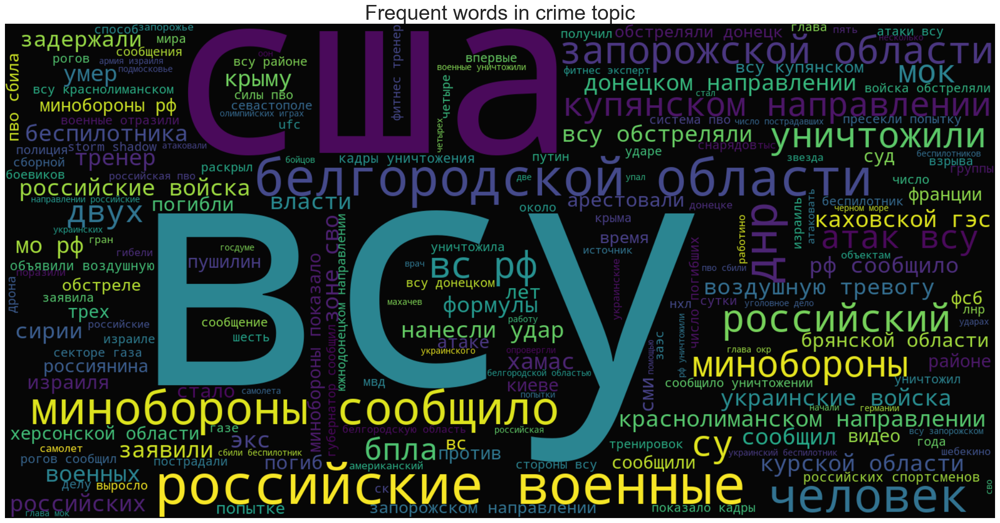

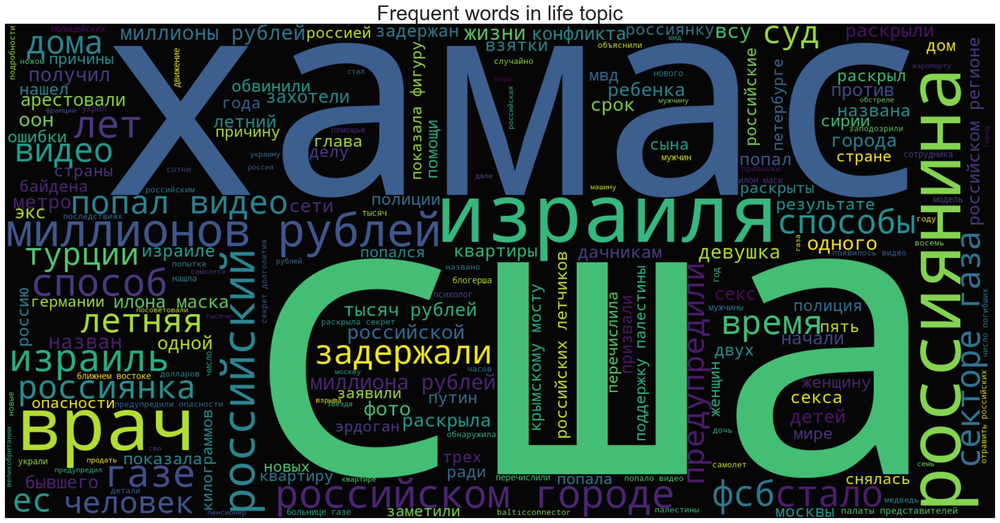

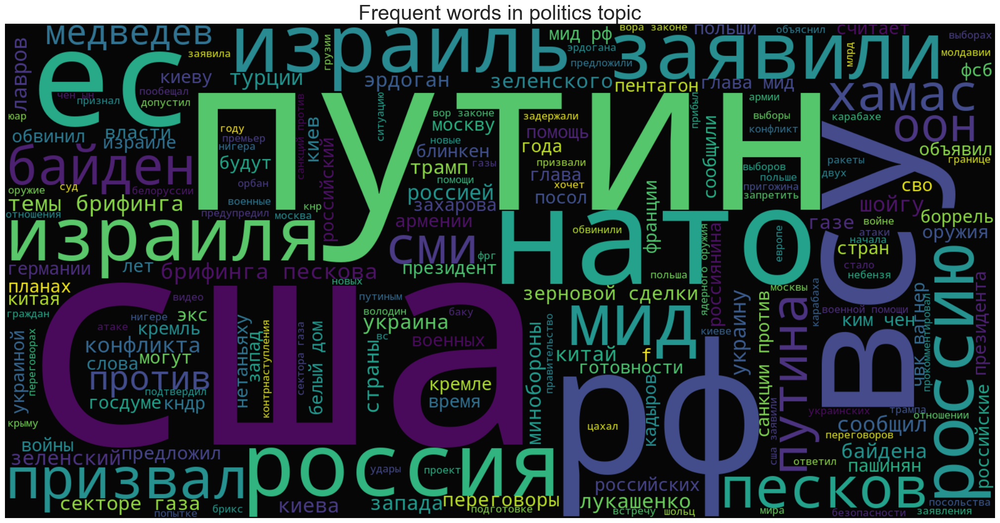

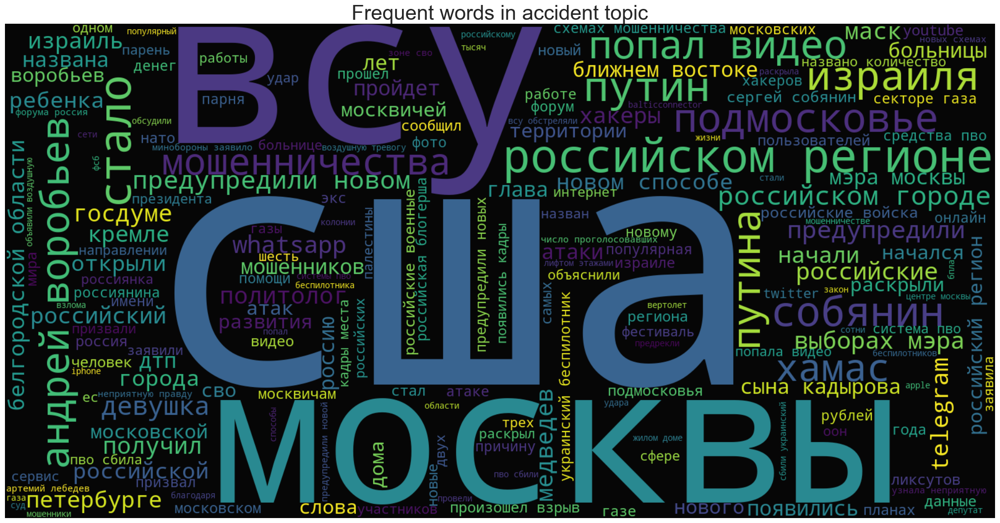

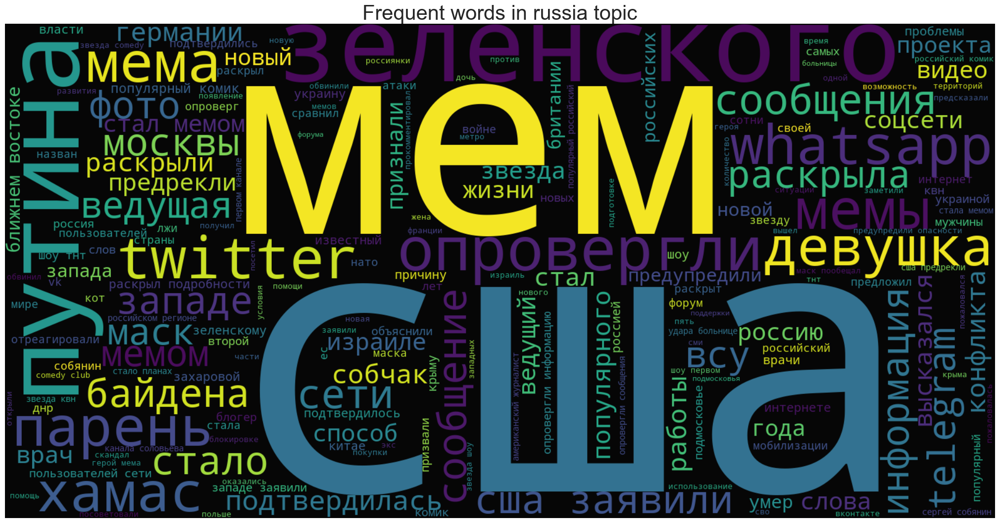

...

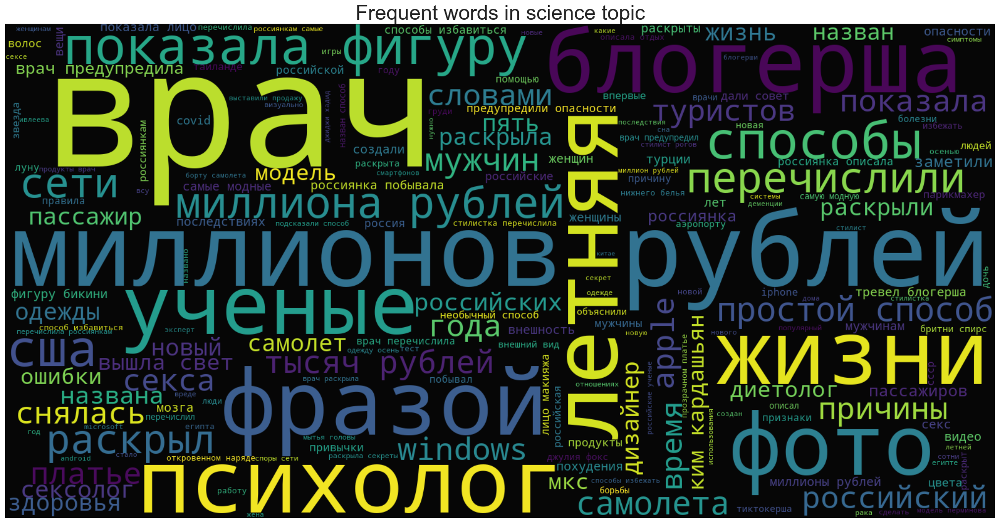

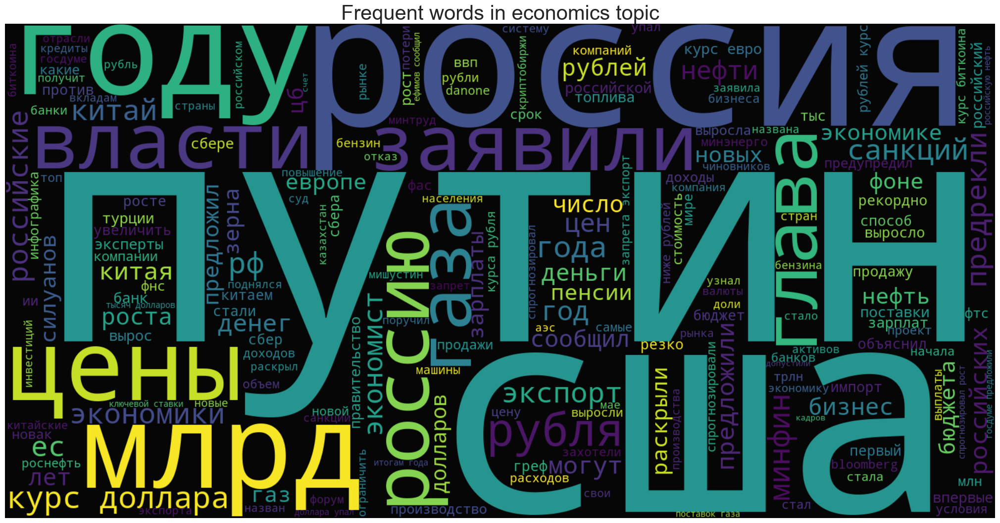

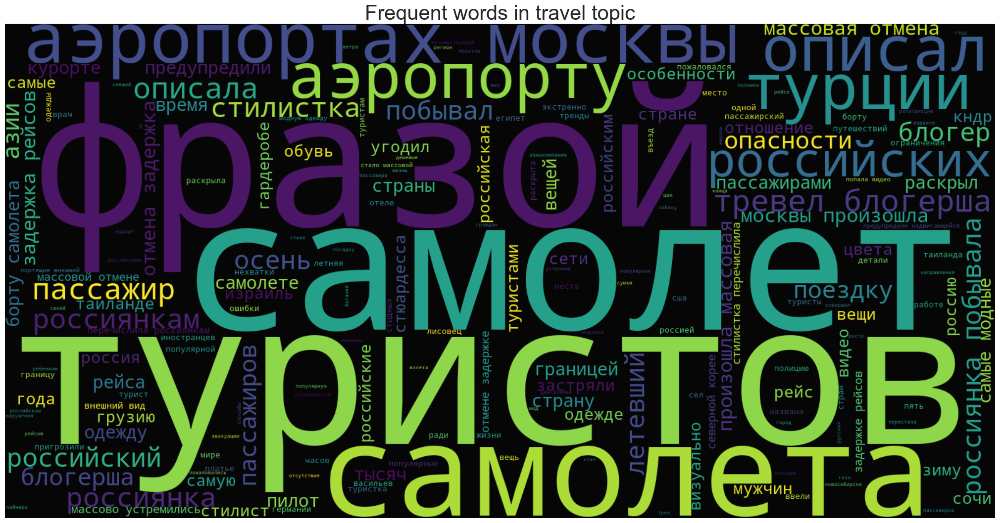

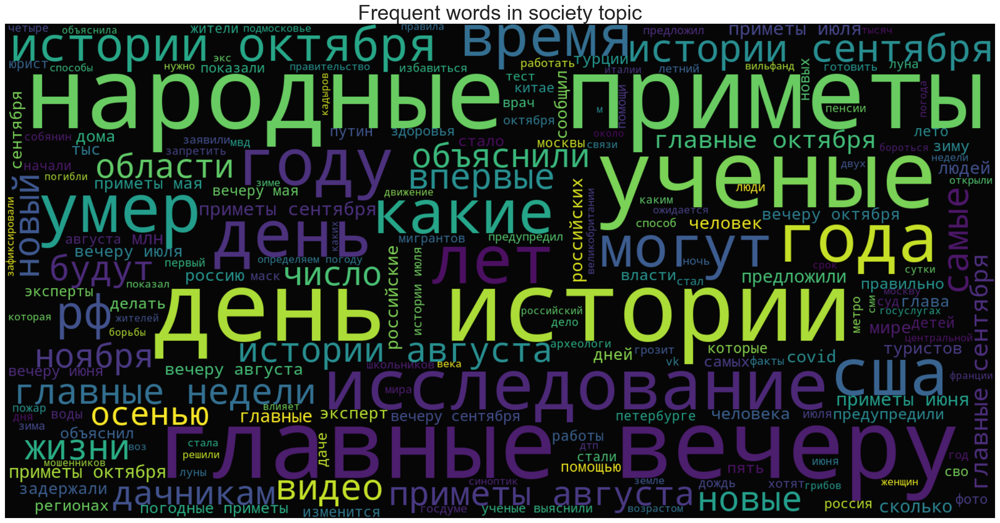

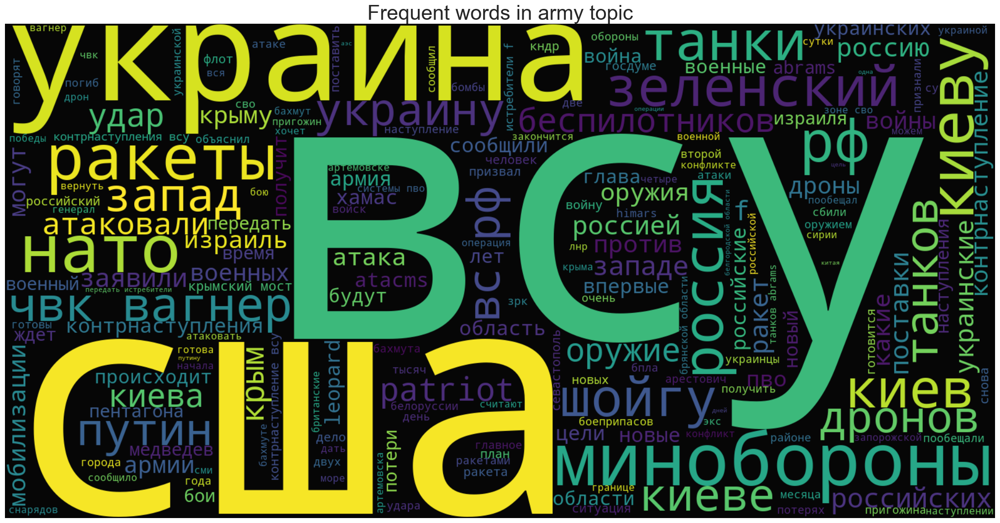

In [51]:
for topic in df.topic.unique():
    words = df[df.topic == topic].title.str.split(' ').explode().values
    words = [word.lower() for word in words if word.lower() not in stop_words]

    wc = WordCloud(background_color="black", width=1600, height=800,  stopwords=stop_words)
    wc.generate(" ".join(words))

    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    plt.axis("off")
    plt.tight_layout(pad=0)
    ax.set_title(f"Frequent words in {topic} topic", fontsize=30)
    ax.imshow(wc, alpha=0.98, interpolation = "bilinear")

Посмотрим распределение возраста статей.

In [19]:
df['lifetime'] = df['datetime'].apply(lambda x: (datetime.datetime.now() - x).total_seconds())
df['lifetime'] = df['lifetime'].apply(lambda x: divmod(x, 60)[0])

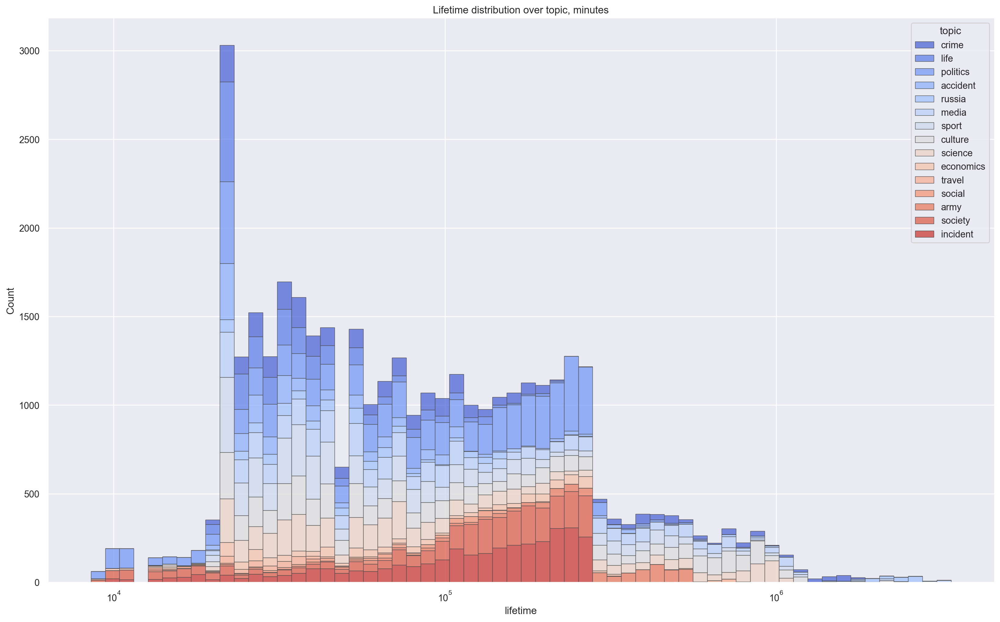

In [20]:
fig, axs = plt.subplots(1, 1, figsize=(20, 12), dpi=200)
sns.despine(fig)

sns.histplot(
    df,
    x="lifetime",
    hue="topic",
    multiple="stack",
    edgecolor=".3",
    palette="coolwarm",
    linewidth=.5,
    log_scale=True,
);
axs.set_title('Lifetime distribution over topic, minutes');

In [21]:
df.to_pickle('df.p', compression='gzip')

Как и ожидалось, в датасете присутствуют как старые статьи, так и новые.

### Выводы

Итак, на данном этапе мы провели первичный анализ датасета. Статьи распределены неравномерно. Большинство новостнй относятся к 2023 году, а больше всего новостей в сентябре и октябре, но это всё потому, что мы выгружали данные в обратном хронологическом порядке и, соответственно, большая часть статей выпала на этот период. По дням недели на текущих данных можно судить уже больше. Меньше всего новостей выходит в выходные и больше всего в среду и четверг.

В среднем длина заголовка по всем категориям около 61 символов. Длина текста имеет тяжелые хвосты, особенно по категориям crime, politics, accident.

Мы также проанализировали основные ключевые слова, которые наводят на гипотезу о том, что статьи разных тематик могут быть сильно похожи по доминирующим ключевым словам и тем самым негативно влиять на модель. Это нужно будет иметь в виду при построоении модели.

Поскольку мы работаем с текстами, на этом этапе пока не столь очевидно, какие данные и по какой причине стоит считать выбросами, а какие - особенностями конкретной тематики. Поэтому это мы оставим на следующие этапы работы над проектом.

In [22]:
print(1+2)

3
